### Beyaz dengesi

Retinadan gelen sinir impulslarını belirleyen, aydınlatılmış bir nesneden gelen ışığın spektrumu, aydınlatmanınkine göre büyük ölçüde değişir, ancak yine de insanların algıladığı renk değişmez. Nitekim turuncu bir ışıkla aydınlatılan beyaz bir yüzey, mavi ile aydınlatılmış gibi aynı sinyali üretmez, ancak her iki durumda da beyaz olarak algılarız. Renk görmenin bu özelliğine **renk sabitliği** denir.

Kameraların sensörleri sadece kendilerine ulaşan ışığın tayfına göre tepki verirler ve renk sabitliği yoktur. Bu sorunun üstesinden gelmek için, cihazlar genellikle standart aydınlatıcılar, "gün ışığı", akkor ve bazen floresan tüp için varsayılan ayarları içerir, ancak en yaygın yöntem, aydınlatma sonucunu ayarlamak için beyaz bir yüzey üzerinde manuel veya otomatik ayardır. Buna **beyaz dengesi** denir.

### Su Emme

Sanılanın aksine su şeffaf değildir. Nitekim görünür aralıkta sıfır olmayan bir absorbansa sahiptir, bu da içinden geçen ışığın rengini kaybedeceği anlamına gelir. Bu absorbans ışığın dalga boyuna bağlıdır ve kırmızı için maviden daha fazladır.

<img src="images_markdown/spectre_eau.gif" width="%40" height="%40"/>
<div align="center"><em>Saf suyun absorpsiyon spektrumu</em></div>

<img src="images_markdown/absorpsiyon.png"/>
<div align="center"><em>Deniz suyu tarafından renk emiliminin şematik gösterimi</em></div>

Böylece dalışta 10m'den itibaren kırmızı renk kaybolur, ardından turuncu, yeşil ve nihayet mavi renk kaybolur. Vizyonumuz buna uyum sağlayabiliyorsa, dijital kameralar için durum böyle değil. Bu yaz (David) dalış yaparken bu sorunla şahsen karşılaştım ve tüm fotoğraflarımın yeşil olduğunu ve gördüklerimle hiçbir ilgisi olmadığını görünce kötü bir sürpriz yaşadım.

In [36]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import math


## Utils

In [14]:
def getImage(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [30]:
def showImages(images):
    fig, axs = plt.subplots(2, 2, figsize = (80,60))
    k = 0
    for j in range(2):
        for i in range(2):
            axs[i,j].imshow(images[k])
            k+=1

## İmages

In [31]:
images = [] 
images.append(getImage("LFT_5424.tif"))
images.append(getImage("LFT_5424.tif"))
images.append(getImage("LFT_5424.tif"))
images.append(getImage("LFT_5424.tif"))

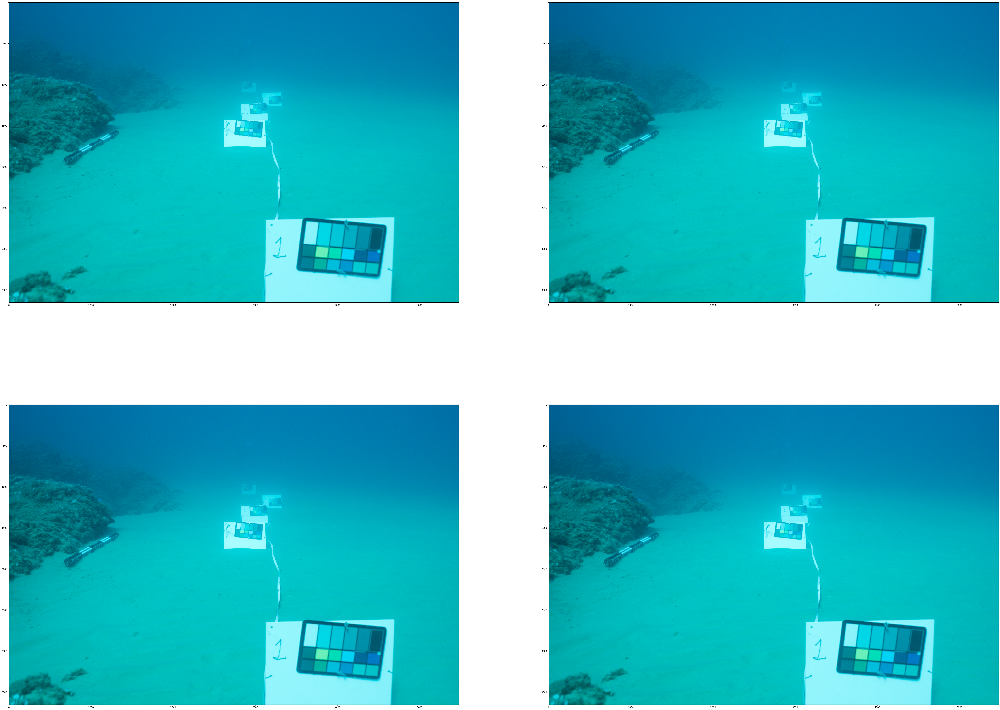

In [32]:
showImages(images)

## Temel $l \alpha \beta$

*SU ALTI GÖRÜNTÜLEME İÇİN YENİ BİR RENK DÜZELTME YÖNTEMİ* makalesi, yeni bir renk uzayı temeli sunar: **$l \alpha \beta$ temeli**. 1998 yılında Ruderman tarafından tanıtılan bu yeni taban, insan gözünün incelenmesine dayanılarak oluşturuldu. **logaritmiktir**, tıpkı insan duyumları gibi. Aslında, duyularımız küçük değişikliklere (ses, parlaklık, renkler...) duyarlı olacak şekilde uyarlanmıştır.

İlk bileşeni olan **parlaklık** akromatiktir ve bir pikselin parlaklığını temsil ederken, diğer iki **$\alpha$** ve **$\beta$** zıt kromatik bileşenlerdir.

$l \alpha \beta$ kanalları, RGB kanallarıyla şu şekilde ilişkilidir:
* parlaklık $\propto$ (r + g + b)
* $\alpha \propto$ (r + g - b)
* $\beta \propto$ (r - g)



Bir pikseli bir tabandan diğerine ve ardından bir görüntüyü bir tabandan diğerine taşıyabilen işlevler yaratacağız.

In [37]:
def RGBtoXYZ(x):
    """
    takes a 3x1 numpy array in the RGB base and returns it in the XYZ base
    """
    

    #T = np.array([[0.4124,0.3576,0.1805],[0.2126,0.7152,0.0722],[0.0193,0.1192,0.9505]])
    T = np.array([[0.5141,0.3239,0.1604],[0.2651,0.6702,0.0641],[0.0241,0.1228,0.8444]])
    return np.matmul(T,x)

def XYZtoRGB(x):
    """
    takes a 3x1 numpy array in the XYZ base and returns it in the RGB base
    """
    #T = np.array([[0.4124,0.3576,0.1805],[0.2126,0.7152,0.0722],[0.0193,0.1192,0.9505]])
    T = np.array([[0.5141,0.3239,0.1604],[0.2651,0.6702,0.0641],[0.0241,0.1228,0.8444]])
    return np.matmul(np.linalg.inv(T),x)

def XYZtoLMS(x):
    """
    takes a 3x1 numpy array in the XYZ base and returns it in the LMS base
    """
    T = np.array([[0.3897,0.6890,-0.0787],[-0.2298,1.1834,0.0464],[0,0,1]])
    return np.matmul(T,x)

def LMStoXYZ(x):
    """
    takes a 3x1 numpy array in the XYZ base and returns it in the RGB base
    """
    T = np.array([[0.3897,0.6890,-0.0787],[-0.2298,1.1834,0.0464],[0,0,1]])
    return np.matmul(np.linalg.inv(T),x)
    
def logLMStoLAB(x):
    """
    takes a 3x1 numpy array in the logLMS base and returns it in the LAB base
    """
    T = np.matmul(np.array([[1/math.sqrt(3),0,0],[0,1/math.sqrt(6),0],[0,0,1/math.sqrt(2)]]),np.array([[1,1,1],[1,1,-2],[1,-1,0]]))
    return np.matmul(T,x)

def LABtologMLS(x):
    """
    takes a 3x1 numpy array in the LAB base and returns it in the logLMS base
    """
    T = np.matmul(np.array([[1/math.sqrt(3),0,0],[0,1/math.sqrt(6),0],[0,0,1/math.sqrt(2)]]),np.array([[1,1,1],[1,1,-2],[1,-1,0]]))

    return np.matmul(np.linalg.inv(T),x)


#### Not :
XYZ'den LMS'ye geçiş matrisi için *SU ALTI GÖRÜNTÜLEME İÇİN YENİ BİR RENK DÜZELTME YÖNTEMİ* makalesinde bir hata fark ettik. Nitekim biraz araştırma yaptıktan sonra ilk satırın üçüncü katsayısının 0,0787** yerine **-0,0787 olduğunu fark ettik.

**Kaynak:**
* https://stackoverflow.com/questions/32696138/converting-from-rgb-to-lαβ-color-spaces-and-converting-it-back-to-rgb-using-open
* https://www.researchgate.net/profile/Nizar_Zarka/publication/311946632_Color_Transfer_between_Images/links/5864fdc008ae6eb871adae3b/Color-Transfer-between-Images.pdf

Stackoverflow bağlantısında, RGB'den XYZ'ye geçiş matrisi aynı değildir çünkü bu bizim kullandığımızdan başka bir RGB standardıdır. Ayrıca, XYZ'den LMS'ye geçiş matrisinin ilk satırının üçüncü katsayısının 0,0787 yerine -0,0787 olması dönüşümün tersinir karakterini değiştirmiyorsa, fark daha sonra temel işlem algoritmaları kullanıldığında görülür $l \ alfa \beta$.

In [38]:
def RGBtoLAB(x):
    """
    takes a 3x1 numpy array in the RGB base and returns it in the LAB base
    """
    y = XYZtoLMS(RGBtoXYZ(x))
    for i in range(3):
        y[i] = math.log(y[i] + 10**(-4)) / math.log(10)
    return logLMStoLAB(y)
    
def LABtoRGB(x):
    """
    takes a 3x1 numpy array in the LAB base and returns it in the RGB base
    """
    y = LABtologMLS(x)
    for i in range(3):
        y[i] = 10**(y[i]) 
    return XYZtoRGB(LMStoXYZ(y))

**RGBtoLAB** ve **LABtoRGB** işlevleri, bir pikseli RGB tabanından $l \alpha \beta$ tabanına ve tersi yönde geçirmek için kullanılır. Bu nedenle artık bir görüntüyü RGB tabanından $l \alpha \beta$ tabanına geçirmeyi mümkün kılan **imageRGBtoLAB** ve **imageLABtoRGB** işlevlerini kodlayabiliriz.

In [39]:
def imageRGBtoLAB(im):
    im_LAB = im.copy().astype(np.double)
    for ligne in im_LAB:
        for i in range(len(ligne)) :
            #print("RGB to lab pre ",ligne[i])
            ligne[i] = RGBtoLAB(ligne[i])
            #print("RGB to lab post ",ligne[i])
    return im_LAB

def imageLABtoRGB(im):
    im_LAB = im.copy().astype(np.double)
    for ligne in im_LAB:
        for i in range(len(ligne)) :
            #print("lab to  rgb  pre ",ligne[i])
            ligne[i] = LABtoRGB(ligne[i])
            #print("lab to  rgb  post ",ligne[i])
    return im_LAB.astype(np.uint8)

In [ ]:
photo_test = getImage("LFT_5424.tif")
photo_test_lab = imageRGBtoLAB(photo_test)
photo_test_rgb = imageLABtoRGB(photo_test_lab)

fig, axs = plt.subplots(1, 3, figsize = (70,70))
axs[0].imshow(photo_test)
axs[0].set_title("Photo originale", fontsize = 50)
axs[1].imshow(photo_test_lab)
axs[1].set_title("Photo en base lab", fontsize = 50)
axs[2].imshow(photo_test_rgb)
axs[2].set_title("Photo repassée en rgb", fontsize = 50)